# О работе

Эта лабораторная работа направлена на изучение базовых алгоритмов классификации с использыванием библиотеки scikit-learn.

Предложено ознакомиться с работой таких классификаторов, как:
1. K-Nearest Neighbors Algorithm.
2. Decision Tree Algorithm.
3. Support Vector Machines Algorithm.
4. Random Forest Algorithm.
5. AdaBoost Algorithm.

## Импорт необходимых для работы библиотек

In [1]:
# Установка пакета scikit-learn
%pip install scikit-learn

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Установка пакета pandas
%pip install pandas

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
# Установка пакета matplotlib
%pip install matplotlib

Defaulting to user installation because normal site-packages is not writeable
Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 23.1.2 -> 23.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
# Необходимые импорты для всякого классификатора
import pandas as pd
# import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

from sklearn.preprocessing import StandardScaler
from sklearn.metrics import classification_report,confusion_matrix, accuracy_score
from sklearn.model_selection import train_test_split
# from sklearn import metrics

# Импорты только для kNN
from sklearn.neighbors import KNeighborsClassifier

# Импорты только для Decision Tree
from sklearn.tree import DecisionTreeClassifier, plot_tree

# Импорты только для SVM 
from sklearn.svm import SVC
from sklearn.model_selection import GridSearchCV

# Импорты только для Random Forest
# from IPython.display import Image
import graphviz
from random import randint
from sklearn.tree import export_graphviz
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import RandomizedSearchCV

# Импорты только для AdaBoost
from sklearn.ensemble import AdaBoostClassifier

## Подключение [датасета](https://www.kaggle.com/datasets/uom190346a/water-quality-and-potability/)

Замечание: так как датасет я искал не одним из первых среди студентов данного курса, то он вышел не совсем совершенным, из-за чего точность работы некоторых методов оставляет желать лучшего. 

### Считываем [датасет](https://www.kaggle.com/datasets/uom190346a/water-quality-and-potability/)

In [5]:
# Загоняем датасет в переменную "data_df" 
data_df = pd.read_csv('../DATASET/DATASET.csv')

### Вывод основной информации о датасете

In [6]:
# Выводим первые несколько рядком для того, чтобы понять, правильно ли загружены данные
data_df.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity,Potability
0,0.00,204.89,20791.32,7.30,368.52,564.31,10.38,86.99,2.96,0.0
1,3.72,129.42,18630.06,6.64,0.00,592.89,15.18,56.33,4.50,0.0
2,8.10,224.24,19909.54,9.28,0.00,418.61,16.87,66.42,3.06,0.0
3,8.32,214.37,22018.42,8.06,356.89,363.27,18.44,100.34,4.63,0.0
4,9.09,181.10,17978.99,6.55,310.14,398.41,11.56,32.00,4.08,0.0


In [7]:
# Выводим размер датасета
data_df.size

32760

In [8]:
# Выводим информацию о типе данных каждой отдельно взятой колонке и общую информацию о таблице
data_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3276 entries, 0 to 3275
Data columns (total 10 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   ph               3276 non-null   float64
 1   Hardness         3276 non-null   float64
 2   Solids           3276 non-null   float64
 3   Chloramines      3276 non-null   float64
 4   Sulfate          3276 non-null   float64
 5   Conductivity     3276 non-null   float64
 6   Organic_carbon   3276 non-null   float64
 7   Trihalomethanes  3276 non-null   float64
 8   Turbidity        3276 non-null   float64
 9   Potability       3276 non-null   float64
dtypes: float64(10)
memory usage: 256.1 KB


In [9]:
# Выводим количество содержащих значение "null" ячеек для каждой колонки
data_df.isnull().sum()

ph                 0
Hardness           0
Solids             0
Chloramines        0
Sulfate            0
Conductivity       0
Organic_carbon     0
Trihalomethanes    0
Turbidity          0
Potability         0
dtype: int64

In [10]:
# Выводим количество рядков в датасете до очищения таблицы от тех, в которых содержиться "null"
data_df.shape

(3276, 10)

In [11]:
# Найдём рядки со значением "#NUM!" и удалим их из набора данных
data_df = data_df[data_df != '#NUM!'].dropna()

In [12]:
# Выводим количество рядков в датасете после очищения таблицы от тех, в которых содержиться "null"
data_df.shape

(3276, 10)

### Разбиение данных

In [13]:
# Присваиваем переменной "X" таблицу, равную исходной, но без колонки 'Potability'
X = data_df.drop(['Potability'], axis = 1)
# Присваиваем переменной "y" таблицу, равную колонке 'Potability'
y = data_df['Potability']

# Генерируем тренировочные и тестовые данные случайно
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20)

In [14]:
# Проверяем правильно ли выглядят тренировочные данные
X_train.head()


,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
1420,0.00,182.06,17869.46,9.83,361.54,359.45,20.21,49.16,4.17
1755,0.00,191.15,23172.28,7.13,290.71,365.14,12.68,69.07,4.02
1531,6.69,200.40,37033.15,4.73,280.84,376.67,12.49,57.82,2.94
1675,0.00,193.17,20894.40,7.33,359.43,417.42,16.79,38.11,3.82
1723,6.12,240.98,15765.79,10.09,339.40,407.32,21.31,63.07,3.72


In [15]:
# Проверяем правильно ли выглядят тестовые данные
X_test.head()

,ph,Hardness,Solids,Chloramines,Sulfate,Conductivity,Organic_carbon,Trihalomethanes,Turbidity
1896,7.04,229.60,12575.28,7.84,390.47,558.18,15.75,36.27,4.28
1521,5.94,214.47,10815.40,7.80,0.00,626.13,17.48,59.99,3.89
1341,0.00,194.45,41461.32,6.95,239.91,362.50,14.11,58.75,4.89
488,8.57,200.07,9782.34,5.66,0.00,511.16,11.86,66.05,4.60
1714,0.00,171.43,39207.59,4.71,354.44,381.69,20.21,97.42,2.81


In [16]:
print("Количество рядков в тренировочных данных: \"" + str(X_train.shape[0]) + "\".")
print("Количество рядков в тестовых данных: \"" + str(X_test.shape[0]) + "\".")

Количество рядков в тренировочных данных: "2620".
Количество рядков в тестовых данных: "656".


In [17]:
# Проверяем правильно выглядят тренировочные данные
y_train.head()

1420    0.0
1755    0.0
1531    1.0
1675    0.0
1723    0.0
Name: Potability, dtype: float64

In [18]:
# Проверяем правильно выглядят тестовые данные
y_test.head()

1896    1.0
1521    1.0
1341    0.0
488     0.0
1714    0.0
Name: Potability, dtype: float64

In [19]:
print("Количество рядков в тренировочных данных: \"" + str(y_train.shape[0]) + "\".")
print("Количество рядков в тестовых данных: \"" + str(y_test.shape[0]) + "\".")

Количество рядков в тренировочных данных: "2620".
Количество рядков в тестовых данных: "656".


### Масштабирование данных

In [20]:
scaler = StandardScaler()
scaler.fit(X_train)

StandardScaler()

In [21]:
scaled_X_train = scaler.transform(X_train) 
scaled_X_test = scaler.transform(X_test) 

## kNN

In [22]:
# Начнём с метода kNN, то есть k ближайших соседей. 
# Переменная "n_neighbors" как раз и отвечает за количество таких соседей.

# Создаём экземпляр класса "KNeighborsClassifier" "knn" 
knn = KNeighborsClassifier(n_neighbors=5)

In [23]:
# Обучаем модель
knn.fit(scaled_X_train, y_train)

KNeighborsClassifier()

In [24]:
# Предсказываем данные
pred = knn.predict(scaled_X_test)

### Оцениваем точность классификации

Матрица ошибок в нашем случае будет иметь вид

$$
     \begin{bmatrix}
\text{True Negative} & \text{False Positive} \\
\text{False Negative} & \text{True Positive}\\
\end{bmatrix}
$$

In [25]:
# Выводим матрицу ошибок
print(confusion_matrix(y_test,pred))

[[311 102]
 [156  87]]


Команда `print(classification_report(y_test, pred))` используется для вывода отчета о классификации, который включает в себя несколько важных метрик для оценки производительности классификатора. Параметры, выводимые этой командой, включают следующие метрики:

1. **Точность (Precision):**
   - Precision показывает, как много из объектов, которые модель предсказала как положительные, действительно являются положительными.
   - Формула: Precision = TP / (TP + FP), где TP - True Positive, FP - False Positive.

2. **Полнота (Recall или Sensitivity):**
   - Recall показывает, как много из всех положительных объектов модель смогла обнаружить.
   - Формула: Recall = TP / (TP + FN), где TP - True Positive, FN - False Negative.

3. **F1-мера (F1-Score):**
   - F1-мера представляет собой гармоническое среднее между точностью и полнотой. Эта метрика полезна, когда важны и точность, и полнота.
   - Формула: F1-Score = 2 * (Precision * Recall) / (Precision + Recall).

4. **Поддержка (Support):**
   - Поддержка представляет собой количество фактических случаев в каждом классе.

5. **Макро-усреднение (Macro Avg):**
   - Усреднение значений по всем классам без учета их размера.

6. **Микро-усреднение (Micro Avg):**
   - Усреднение значений по всем классам с учетом их размера.

7. **Взвешенное-усреднение (Weighted Avg):**
   - Усреднение значений по всем классам с учетом их размера, взвешенное по количеству элементов в каждом классе.

In [26]:

print(classification_report(y_test,pred))

              precision    recall  f1-score   support

         0.0       0.67      0.75      0.71       413
         1.0       0.46      0.36      0.40       243

    accuracy                           0.61       656
   macro avg       0.56      0.56      0.55       656
weighted avg       0.59      0.61      0.59       656



In [27]:
# Выведем более точную цифру процента правильных классификаций
print(accuracy_score(y_test,pred))

0.6067073170731707


### Проведём поиск наиболее оптимального значение числа соседей

In [28]:
error_rate = []

for i in range(1,30):
    knn = KNeighborsClassifier(n_neighbors=i)
    knn.fit(scaled_X_train,y_train)
    pred_i = knn.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

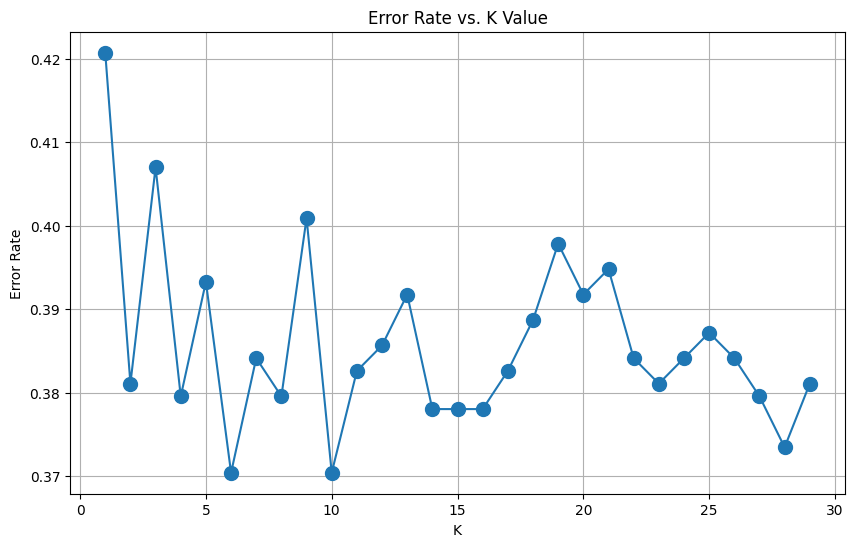

In [29]:
plt.figure(figsize=(10,6))
plt.plot(range(1,30), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. K Value')
plt.xlabel('K')
plt.ylabel('Error Rate')
plt.grid()

In [30]:
min_value = error_rate[0]

for error_value in error_rate:
     if error_value < min_value:
          min_value = error_value

min_index = error_rate.index(min_value)

print("Наименьшее значение было при k = " + str(min_index))

Наименьшее значение было при k = 5


In [31]:
knn = KNeighborsClassifier(n_neighbors=17)

knn.fit(scaled_X_train,y_train)
pred = knn.predict(scaled_X_test)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))

[[355  58]
 [193  50]]

              precision    recall  f1-score   support

         0.0       0.65      0.86      0.74       413
         1.0       0.46      0.21      0.28       243

    accuracy                           0.62       656
   macro avg       0.56      0.53      0.51       656
weighted avg       0.58      0.62      0.57       656



## Decision Tree

In [32]:
# Проверим какие уникальные значения храняться в переменной "y"
set(y)

{0.0, 1.0}

In [33]:
# Создаём экземпляр класса с параметром "gini", который измеряет вероятность того, что случайно 
# выбранный элемент будет неправильно классифицирован. 
# Gini impurity равно 0, если все элементы в узле принадлежат к одному классу, 
# и равно 0.5 (максимум) в случае равномерного распределения классов.
model = DecisionTreeClassifier(criterion='gini')

In [34]:
model.fit(X_train, y_train)

DecisionTreeClassifier()

### Оцениваем

In [35]:
y_pred = model.predict(X_test)

In [36]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.70      0.67      0.69       413
         1.0       0.48      0.51      0.49       243

    accuracy                           0.61       656
   macro avg       0.59      0.59      0.59       656
weighted avg       0.62      0.61      0.61       656



In [37]:
print(confusion_matrix(y_test, y_pred))

[[278 135]
 [120 123]]


### Визуализируем данные

In [38]:
plt.figure(figsize = (300, 300))
plot_tree(model, feature_names = ['ph', 'Hardness', 'Solids', 'Chloramines', 'Sulfate', 'Conductivity', 'Organic_carbon', 'Trihalomethanes', 'Turbidity'], class_names = ['0', '1'], filled = True)
plt.show()

## Support Vector Machines

1. **C:** Этот параметр контролирует штраф за ошибки классификации. Значение `C=1.0` указывает на среднюю степень строгости классификации.
2. **gamma:** Этот параметр контролирует ширину ядра для ядерных функций, таких как Radial Basis Function (RBF). Значение `gamma=1.0` указывает на среднюю ширину ядра.
3. **kernel:** Этот параметр определяет тип используемого ядра. Значение `'rbf'` указывает на использование радиально-базисной функции (RBF) в качестве ядра. RBF-ядро часто используется из-за своей универсальности.
4. **cache_size:** Этот параметр определяет размер кэша в мегабайтах (MB), который используется для хранения части матрицы ядра. Значение `cache_size=7000` указывает на установку относительно большого кэша, что может быть полезным для обработки больших объемов данных.

In [39]:
# Создаём экземпяр класса
model = SVC(C=1.0, gamma = 1.0, kernel = 'rbf', cache_size=7000)
model.fit(scaled_X_train,y_train)

SVC(cache_size=7000, gamma=1.0)

In [40]:
y_pred = model.predict(scaled_X_test)

### Оцениваем

In [41]:
print(confusion_matrix(y_test, y_pred))

[[380  33]
 [212  31]]


In [42]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

         0.0       0.64      0.92      0.76       413
         1.0       0.48      0.13      0.20       243

    accuracy                           0.63       656
   macro avg       0.56      0.52      0.48       656
weighted avg       0.58      0.63      0.55       656



### Подбираем наилучшие параметры

In [43]:
# Определяем сетку параметров
param_grid = {'C': [0.1, 1, 10, 100, 1000], 'gamma': [1,0.1,0.01,0.001,0.0001], 'kernel': ['rbf']} 

In [44]:
# Выполняем обучение и оценку модели для каждой комбинации значений параметров C, gamma и kernel из заданных списков, 
# то есть поиск по сетке гиперпараметров модели
grid = GridSearchCV(SVC(), param_grid, refit=True)

In [45]:
grid.fit(scaled_X_train,y_train)

GridSearchCV(estimator=SVC(),
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']})

In [46]:
grid.best_params_

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

In [47]:
grid.best_estimator_

SVC(C=10, gamma=0.1)

In [48]:
grid_predictions = grid.predict(scaled_X_test)
print(confusion_matrix(y_test,grid_predictions))

[[344  69]
 [157  86]]


In [49]:
print(classification_report(y_test,grid_predictions))

              precision    recall  f1-score   support

         0.0       0.69      0.83      0.75       413
         1.0       0.55      0.35      0.43       243

    accuracy                           0.66       656
   macro avg       0.62      0.59      0.59       656
weighted avg       0.64      0.66      0.63       656



## Random Forest

1. **max_depth**: определяет максимальную глубину деревьев решений в ансамбле.
2. **random_state**: используется для установки начального значения для генератора случайных чисел. Это влияет на случайный процесс при построении леса, и установка random_state позволяет воспроизводить результаты.
3. **n_estimators**: определяет количество деревьев в лесу.

In [50]:
random_forest = RandomForestClassifier(max_depth=2, random_state=0, n_estimators=200)
random_forest.fit(scaled_X_train, y_train)

RandomForestClassifier(max_depth=2, n_estimators=200, random_state=0)

In [51]:
pred = random_forest.predict(scaled_X_test)

### Оцениваем

In [52]:
print(confusion_matrix(y_test,pred))

[[413   0]
 [241   2]]


In [53]:
print(classification_report(y_test,pred, zero_division=1))

              precision    recall  f1-score   support

         0.0       0.63      1.00      0.77       413
         1.0       1.00      0.01      0.02       243

    accuracy                           0.63       656
   macro avg       0.82      0.50      0.40       656
weighted avg       0.77      0.63      0.49       656



In [54]:
# Отображаем количество более точный процент правильных классификаций
print(accuracy_score(y_test,pred))

0.6326219512195121


### Подбор параметров

In [55]:
error_rate = []

for i in range(1,30):
    random_forest = RandomForestClassifier(max_depth=i, random_state=0, n_estimators=200)
    random_forest.fit(scaled_X_train, y_train)
    pred_i = random_forest.predict(scaled_X_test)
    # Рассчитаем среднее значение ошибки классификациидля текущей максимальной глубины
    error_rate.append(np.mean(pred_i != y_test)) 

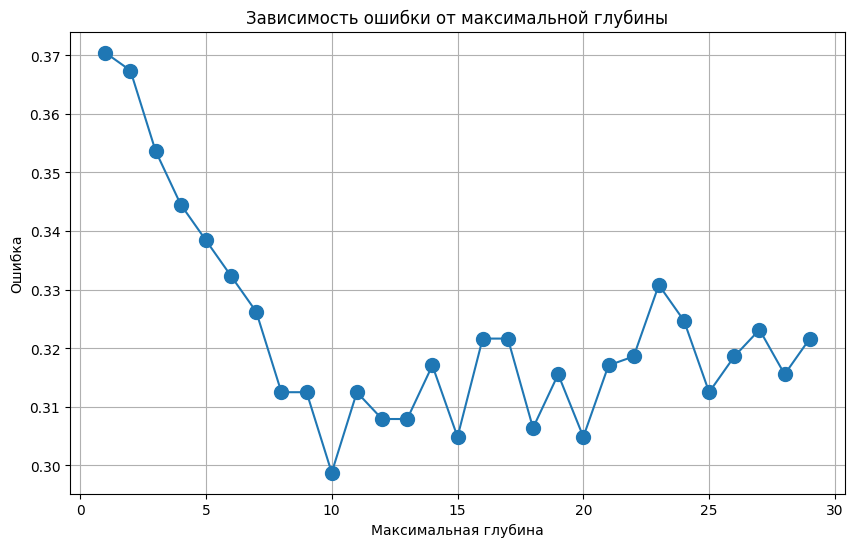

In [56]:
plt.figure(figsize=(10,6))
plt.plot(range(1,30), error_rate, marker='o', markersize=10)
plt.title('Зависимость ошибки от максимальной глубины')
plt.xlabel('Максимальная глубина')
plt.ylabel('Ошибка')
plt.grid()

In [57]:
error_rate = []

for i in range(1,500):
    random_forest = RandomForestClassifier(max_depth=2, random_state=0, n_estimators=i)
    random_forest.fit(scaled_X_train, y_train)
    pred_i = random_forest.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

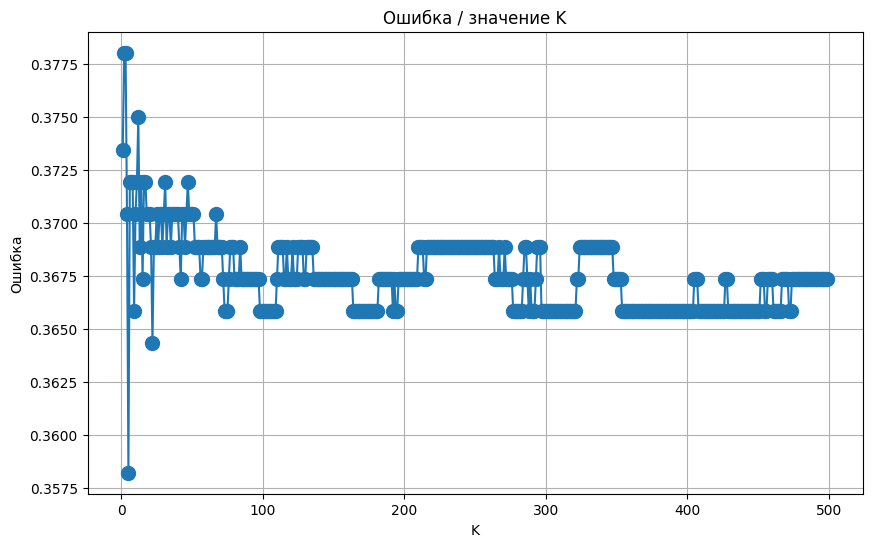

In [58]:
plt.figure(figsize=(10,6))
plt.plot(range(1,500), error_rate, marker='o', markersize=10)
plt.title('Ошибка / значение K')
plt.xlabel('K')
plt.ylabel('Ошибка')
plt.grid()

In [59]:
random_forest = RandomForestClassifier()
random_forest.fit(scaled_X_train, y_train)
pred = random_forest.predict(scaled_X_test)
param_dist = {'n_estimators': randint(50,500),
              'max_depth': randint(1,20)}
rand_search = RandomizedSearchCV(random_forest, 
                                 param_distributions = param_dist, 
                                 n_iter=5, 
                                 cv=5)
print('Наилучшие гиперпараметры:',  rand_search)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))

Наилучшие гиперпараметры: RandomizedSearchCV(cv=5, estimator=RandomForestClassifier(), n_iter=5,
                   param_distributions={'max_depth': 2, 'n_estimators': 86})
[[362  51]
 [148  95]]

              precision    recall  f1-score   support

         0.0       0.71      0.88      0.78       413
         1.0       0.65      0.39      0.49       243

    accuracy                           0.70       656
   macro avg       0.68      0.63      0.64       656
weighted avg       0.69      0.70      0.67       656



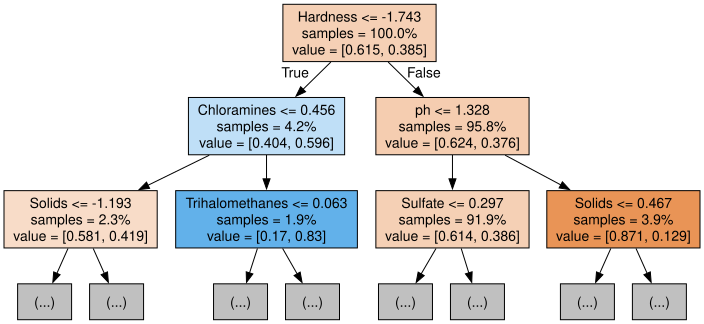

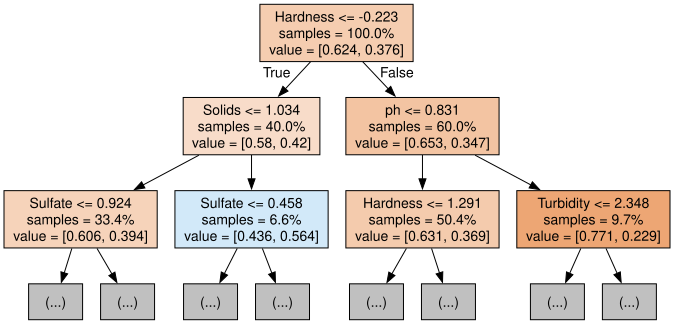

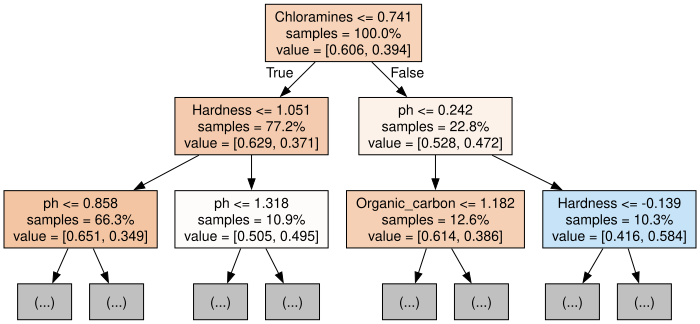

In [60]:
for i in range(3):
    tree = random_forest.estimators_[i]
    dot_data = export_graphviz(tree,
                               feature_names=X_train.columns,  
                               filled=True,  
                               max_depth=2, 
                               impurity=False, 
                               proportion=True)
    graph = graphviz.Source(dot_data)
    display(graph)

## AdaBoost

1. **n_estimators**: количество базовых классификаторов, которые будут использованы в ансамбле.
2. **learning_rate**: коэффициент обучения со значением по-умолчанию равным единице.

In [61]:
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1)
abc.fit(scaled_X_train, y_train)

AdaBoostClassifier(learning_rate=1)

In [62]:
pred = abc.predict(scaled_X_test)

### Оценка

In [63]:
print(confusion_matrix(y_test,pred))

[[365  48]
 [186  57]]


In [64]:
print(classification_report(y_test,pred))

              precision    recall  f1-score   support

         0.0       0.66      0.88      0.76       413
         1.0       0.54      0.23      0.33       243

    accuracy                           0.64       656
   macro avg       0.60      0.56      0.54       656
weighted avg       0.62      0.64      0.60       656



In [65]:
print(accuracy_score(y_test,pred))

0.6432926829268293


### Подбор параметров

In [66]:
error_rate = []

for i in range(1,50):
    abc = AdaBoostClassifier(n_estimators=i, learning_rate=1)
    abc.fit(scaled_X_train, y_train)
    pred_i = abc.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

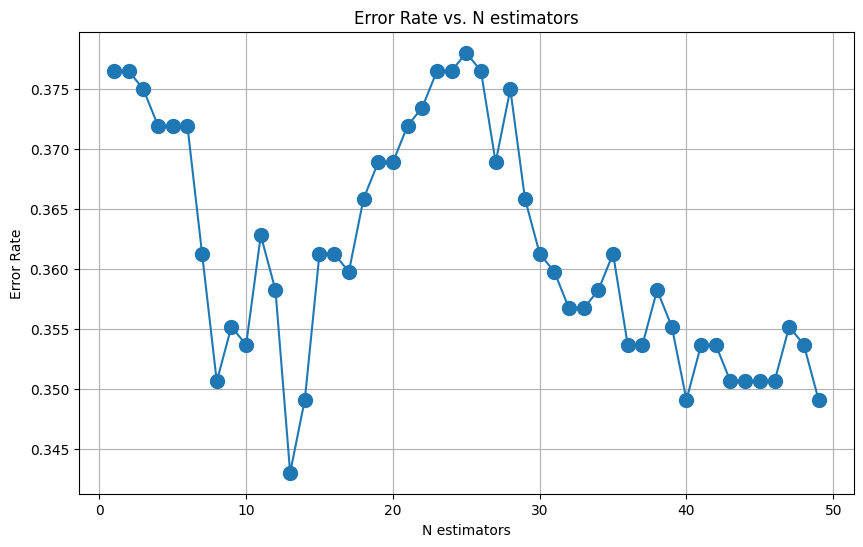

In [67]:
plt.figure(figsize=(10,6))
plt.plot(range(1,50), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. N estimators')
plt.xlabel('N estimators')
plt.ylabel('Error Rate')
plt.grid()

In [68]:
error_rate = []

for i in range(1,20):
    abc = AdaBoostClassifier(n_estimators=5, learning_rate=i)
    abc.fit(scaled_X_train, y_train)
    pred_i = abc.predict(scaled_X_test)
    error_rate.append(np.mean(pred_i != y_test))

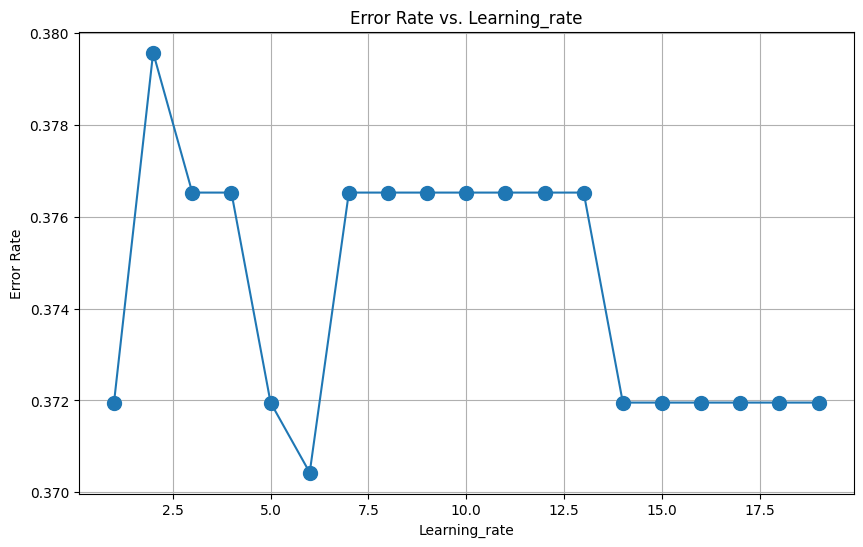

In [69]:
plt.figure(figsize=(10,6))
plt.plot(range(1,20), error_rate, marker='o', markersize=10)
plt.title('Error Rate vs. Learning_rate')
plt.xlabel('Learning_rate')
plt.ylabel('Error Rate')
plt.grid()

In [70]:
abc = AdaBoostClassifier(n_estimators=50, learning_rate=1)

abc.fit(scaled_X_train, y_train)
pred = abc.predict(scaled_X_test)

print(confusion_matrix(y_test,pred))
print()
print(classification_report(y_test,pred))

[[365  48]
 [186  57]]

              precision    recall  f1-score   support

         0.0       0.66      0.88      0.76       413
         1.0       0.54      0.23      0.33       243

    accuracy                           0.64       656
   macro avg       0.60      0.56      0.54       656
weighted avg       0.62      0.64      0.60       656

